# 4 Modelado del conjunto de datos
A lo largo de este notebook se cubre parte de la cuarta fase de la metodología CRIPS-DM, en este caso el modelado del conjunto de datos. En este notebook se emplea una arquitectura tipo ensemble conformada por SAM y RetineNet

1. **Comprensión del Negocio (Business Understanding)**
   - Consistente en el entendimiento del objetivo y requisitos del proyecto, traduciendo las necesidades a una definición analítica del problema y una estrategia para abordarlo.

2. **Comprensión de los Datos (Data Understanding)**
   - Relacionada con la carga y primera evaluación del conjunto de datos. Se divide a su vez en carga y análisis exploratorio del conjunto de datos.

3. **Preparación de los Datos (Data Preparation)** 
   - Consistente en la limpieza, preparación y extracción de características de los datos, de vital importancia para el modelado dado que determinará la calidad de los datos.

4. <span style="color:#66FF99;">**Modelado (Modeling)**  </span> 
   - Relacionada con la elección del modelo de machine learning y el ajuste hiperparamétrico. En este caso, el modelo a emplear se tratará de un ensemble que combina la obtención de detecciones de objetos mediante `YOLOv8` y la obtención de las máscaras mediante `Segment Anything Model`.

5. **Evaluación (Evaluation)**  
   - Evaluación de los resultados obtenidos por el modelo, determinando si cumple con los requisitos definidos en la primera de las fases y si es factible su implementación.

6. **Implementación (Deployment)**  
   - Integración del modelo de forma que sea accesible para su uso, en este caso mediante una aplicación web.


## Índice

Este notebook queda dividido en dos bloques principales:

1) Desarrollo de la pipeline de inferencia que representa el modelo ensemble.

2) Obtención de diferentes métricas de rendimiento a partir de un conjunto común de instancias y la pipeline definida para poder comparar entre diferentes modelos.

### 1 Pipeline de inferencia


En este caso, la arquitectura propuesta, representada inferiormente, puede dividirse en hasta dos bloques diferenciados:

1) Detector de instancias mediante Yolov8, obtieninedo como salida las bounding-boxes asociadas.
2) Segmentador de instancias mediante Segment Anything Model a partir de las bounding boxes anteriores.



<img src="./../assets/figs/proposed_retinnet.png" alt="Arquitectura propuesta empleando RetinaNet" style="width: 70%; height: auto;">

## 1. Obtención de las *bounding boxes*

Como primer bloque de la pipeline se desarrolla el código equivalente para la realización de la detección de los objetos.

Para ello se emplea el modelo Retinanet, empleado principalmente por el uso de la funcoón de pérdida focal loss que mejora los resultados tras el entrenamiento en clases que ocupan espacios pequeños en fondos grandes, como sucede en este dataset. 

La aruitectura de este modeo se observa inferiormente:


<img src=".\..\assets\figs\The-architecture-of-the-proposed-model-R-RetinaNet.png" alt="Arquitectura propuesta empleando RetinaNet" style="width: 60%; height: auto;">

In [ ]:
from ultralytics import YOLO
import cv2
from PIL import Image
import matplotlib.pyplot as plt
from tqdm import tqdm

import cv2
import torch
import random
import cv2
import numpy as np
import os
import utils 
from utils import  load_yaml_file
from pycocotools.coco import COCO
from utils import get_one_hot_scores
from utils import plot_bounding_boxes_non_tensor, plot_differences_batch, plot_pipeline_yolo_sam_batch
import time
import pandas as pd
from sklearn.metrics import average_precision_score
import torchvision.transforms as T
from segment_anything import sam_model_registry, SamPredictor


from utils import plot_image_and_mask, mask_generator,plot_bounding_boxes, plot_differences_batch, plot_one_hot_encoded_masks_norm, one_hot_encoder_masks, plot_differences, get_data_id_image



Se carga todas las constantes relativas al proyecto y la API de COCO

In [56]:
yaml = load_yaml_file()
objetives = yaml["objetive_classes"]
N = yaml["size_sample"]

In [57]:
N_CLASSES = len(objetives) + 1

DIR_TRAIN_ANNOTATIONS = yaml["dirs"]["anotaciones"]["train"]
DIR_TRAIN_IMGS = yaml["dirs"]["imagenes"]["train"]
DIR_TRAIN_IMGS = os.path.abspath(os.path.join(os.getcwd(), "..", DIR_TRAIN_IMGS))

coco=COCO(os.path.join(os.getcwd(),"..", DIR_TRAIN_ANNOTATIONS))

loading annotations into memory...
Done (t=83.00s)
creating index...
index created!


In [58]:
categories = coco.loadCats(coco.getCatIds())
category_info_id = {cat['id']: cat['name'] for cat in categories}
category_info_name = { cat['name']:cat['id'] for cat in categories}

id_objetives = [category_info_name[name] for name in objetives]
category_info_objetive = {i:category_info_id[i] for i in id_objetives}
category_info_objetive[0] = "background"


In [59]:
categories_names_by_index = { i: category_info_objetive[id_cat] for i , id_cat in enumerate(sorted(category_info_objetive.keys()))}
categories_index_by_name = { category_info_objetive[id_cat] : i  for i , id_cat in enumerate(sorted(category_info_objetive.keys()))}
dict_class_index = {key:i for i , key in enumerate(sorted(category_info_objetive.keys()))}

mapper_indexModel_index_result = {value:i for i, value in enumerate(sorted(category_info_objetive.keys()))}


In [60]:
img_ids = set(coco.getImgIds(catIds=id_objetives[0]))

for cat in id_objetives[1:]:
    img_ids |= set(coco.getImgIds(catIds=cat))

img_ids = list(img_ids)


print(f"Las imagenes con alguna instancia de las clases target son {len(img_ids)}")

Las imagenes con alguna instancia de las clases target son 79542


En primera instancia se realiza la carga del modelo desde la libreria `ultralytics` en este caso en su version v8

In [61]:
yolo_model = YOLO("yolov8s.pt") 

Se realiza la inferencia con una primera imagen para ver la estructura del output del modelo

In [62]:

image_path = r"C:\Users\ruben\Desktop\code_tfm\dataset\coco\train2017\000000001756.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
results = yolo_model(image)

print("El número de instancias encontradas es de ",len(results[0]), "\n")
print("Los resultados son tales que \n ",results[0], "\n")
print("El formato de salida de una box es tal que: ", results[0].boxes.conf)


0: 480x640 12 persons, 2 bottles, 2 cups, 12 chairs, 14 laptops, 1 keyboard, 1 book, 1677.5ms
Speed: 20.6ms preprocess, 1677.5ms inference, 11.2ms postprocess per image at shape (1, 3, 480, 640)


El número de instancias encontradas es de  44 

Los resultados son tales que 
  ultralytics.yolo.engine.results.Results object with attributes:

boxes: ultralytics.yolo.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'c

In [63]:
results_images = []
results_inference = []


for i, id_image in tqdm(enumerate(img_ids[:10]), total=10):
    inference = {}
    yolo_boxes = []
    yolo_label  = []
    yolo_prob = []

    img_info = coco.loadImgs(id_image)[0]
    img_path = f"{DIR_TRAIN_IMGS}/{img_info['file_name']}"
    image = Image.open(img_path).convert("RGB")
    results_images.append(image)

    results = yolo_model(image)

    for box_info in results[0]:
        x1,y1,x2,y2, conf, label = box_info.boxes.data[0].tolist()

        # Dado que yolo detecta más clases que nuestro conjunto de objetivos presente, filtramos las bounding boxes encontradas
        if (label+1) in id_objetives:
            #x1,y1,x2,y2 = map(int, box.xyxy[0])
            yolo_boxes.append( (x1,y1,x2,y2))
            yolo_prob.append(conf)
            yolo_label.append(label + 1)


    inference["boxes"] = yolo_boxes
    inference["scores"] = yolo_prob
    inference["labels"] = yolo_label


    # print("Instancias detectadas ", len(yolo_boxes))
    # print("Probabilidades asociadas: ", yolo_prob)

    results_inference.append(inference)



  0%|          | 0/10 [00:00<?, ?it/s]
0: 448x640 12 persons, 1 backpack, 4 umbrellas, 1 cup, 2 carrots, 683.5ms
Speed: 4.1ms preprocess, 683.5ms inference, 10.3ms postprocess per image at shape (1, 3, 448, 640)
 10%|█         | 1/10 [00:00<00:06,  1.32it/s]
0: 640x480 1 person, 1 backpack, 1 skis, 748.2ms
Speed: 3.1ms preprocess, 748.2ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 480)
 20%|██        | 2/10 [00:01<00:06,  1.28it/s]
0: 448x640 2 persons, 2 dogs, 2 frisbees, 651.7ms
Speed: 5.5ms preprocess, 651.7ms inference, 3.4ms postprocess per image at shape (1, 3, 448, 640)
 30%|███       | 3/10 [00:02<00:05,  1.35it/s]
0: 512x640 15 persons, 1 bench, 1 skateboard, 767.4ms
Speed: 9.4ms preprocess, 767.4ms inference, 5.8ms postprocess per image at shape (1, 3, 512, 640)
 40%|████      | 4/10 [00:03<00:04,  1.27it/s]
0: 448x640 3 persons, 1 dog, 1 bear, 1 umbrella, 1570.0ms
Speed: 4.1ms preprocess, 1570.0ms inference, 49.8ms postprocess per image at shape (1, 3, 448, 

Mediante las funciones definidas en `utils.py` se visualizan los resultados. En estos podemos observar la influencia del parámetro de sensibilidad, que deberá de ser ajustado para optimizar los resultados obtenidos por el modelo.

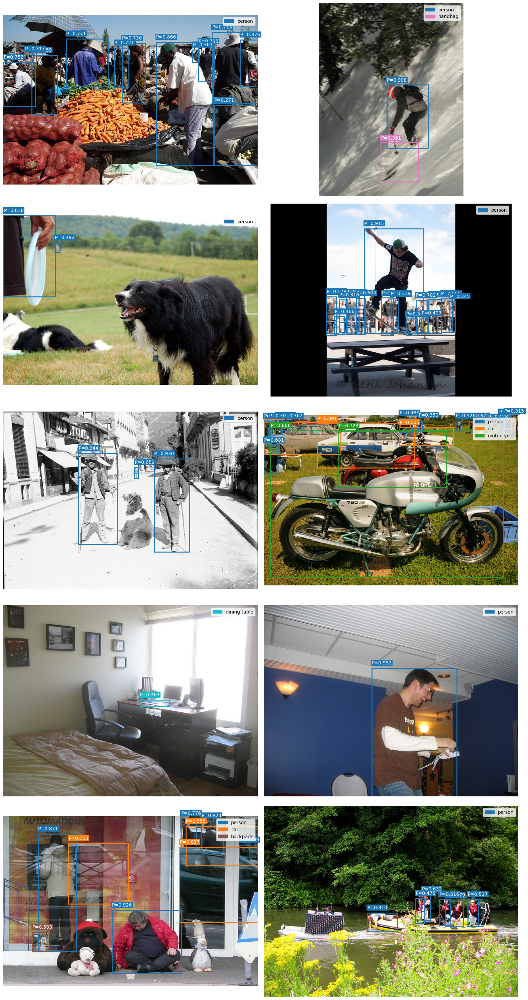

In [64]:
plot_bounding_boxes_non_tensor(results_images,results_inference,category_info_objetive, 0.0)

### 1.2 Obtención de las máscaras asociadas


Se hace uso del modelo SAM para obtener las máscaras de segmentación a partir de las bounding boxes obtenidas de cada una de las imágenes.

En primer lugar se descarga y se indica su path:

In [65]:
CONS_TRHESHOLD = 0.5

In [66]:

sam_checkpoint = r"C:\Users\ruben\Desktop\code_tfm\models\SAM\sam_vit_h_4b8939.pth"
model_type = "vit_h"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device= "cpu" )

sam_model = SamPredictor(sam)

In [67]:
def get_mask(image_id):
    img_info = coco.loadImgs(image_id)[0]
    height, width = img_info['height'], img_info['width']

    ann_ids = coco.getAnnIds(imgIds=image_id)
    anns = coco.loadAnns(ann_ids)

    mask = np.zeros((height, width), dtype=np.uint8)

    for ann in anns:
        category_id = ann['category_id']

        if(category_id in category_info_objetive.keys()):
        
            binary_mask = coco.annToMask(ann)
            mask[binary_mask == 1] = category_id

    return mask




def get_one_hot_scores(current_scores, mask,categories_names_by_index ):
    mask = mask[0]
    one_hot_scores = np.zeros((len(categories_names_by_index), mask.shape[0], mask.shape[1]))

    for clase in sorted(categories_names_by_index.keys()):
        # print("mask shapes", mask.shape)
        # print("class", clase)
        # print("shapes ", one_hot_scores.shape)
        # print("scores shape ", current_scores.shape)
        one_hot_scores[clase, :, :] = np.where(mask == clase,current_scores[0, :, :]  , 0)

    one_hot_scores[0, :, :] = 1 - one_hot_scores[1:, :, :].sum(axis=0)

    #print("output has shape", one_hot_scores.shape)

    return one_hot_scores

Obtenemos los resultados finales de las N primeras máscaras para su posterior evaluación y comparativa con otros modelos.

In [68]:

final_masks = []
masks_scores = []
masks_logits = []
one_hot_scores = []
mask_index = []
ground_truth = []

for i, (img_id, results_detection) in enumerate(tqdm(zip(img_ids[:5], results_inference[:5]), total=len(img_ids[:5]))):

    masks_image = []
    mask_target = []
    scores_image = []
    logits_image = []
    labels_image = []
    mask_probs_image = []

    gt_mask = get_mask(img_id)
    ground_truth.append(gt_mask)

    img_info = coco.loadImgs(img_id)[0]
    img_path = f"{DIR_TRAIN_IMGS}/{img_info['file_name']}"
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    sam_model.set_image(image)

    final_mask = np.zeros(image.shape[:2], dtype=np.uint8)
    current_scores = np.zeros(image.shape[:2], dtype=np.uint8)

    for box, score, label in zip(results_detection['boxes'], results_detection['scores'], results_detection['labels']):
        if(score > CONS_TRHESHOLD and label in category_info_objetive.keys()):
            masks, scores, logits = sam_model.predict(
                point_coords=None,
                point_labels=None,
                box= np.array([round(x) for x in box]),
                multimask_output=False
            )
            
            
            # print("image has shape ",image.shape )
            # print("mask have shape ",masks.shape )
            # print("logits has shape ",logits.shape )
            # print("\n")
            
            masks_image.append(masks)
            scores_image.append(scores)
            logits_image.append(logits[0])
            labels_image.append(label)

    #print("scores are ", scores_image, "for classes ", labels_image)


    for mask, mask_score, label in zip(masks_image, scores_image, labels_image):
        if np.any(mask):
            # print("mask has avlue and label is ", label)
            mask_values = np.where(mask, mask_score, 0)
            final_mask = np.where(mask_values > current_scores , label, final_mask)

            # print("current final value is ", np.unique(final_mask))
            current_scores = np.maximum(mask_values, current_scores)


    final_masks.append(final_mask[0])
    masks_scores.append(current_scores)

    lookup = np.vectorize(lambda k: dict_class_index[k])
    mask_by_index = lookup(final_mask)
    mask_index.append(mask_by_index) 
    one_hot_scores.append(get_one_hot_scores(current_scores,mask_by_index,categories_names_by_index))






100%|██████████| 5/5 [09:35<00:00, 115.04s/it]


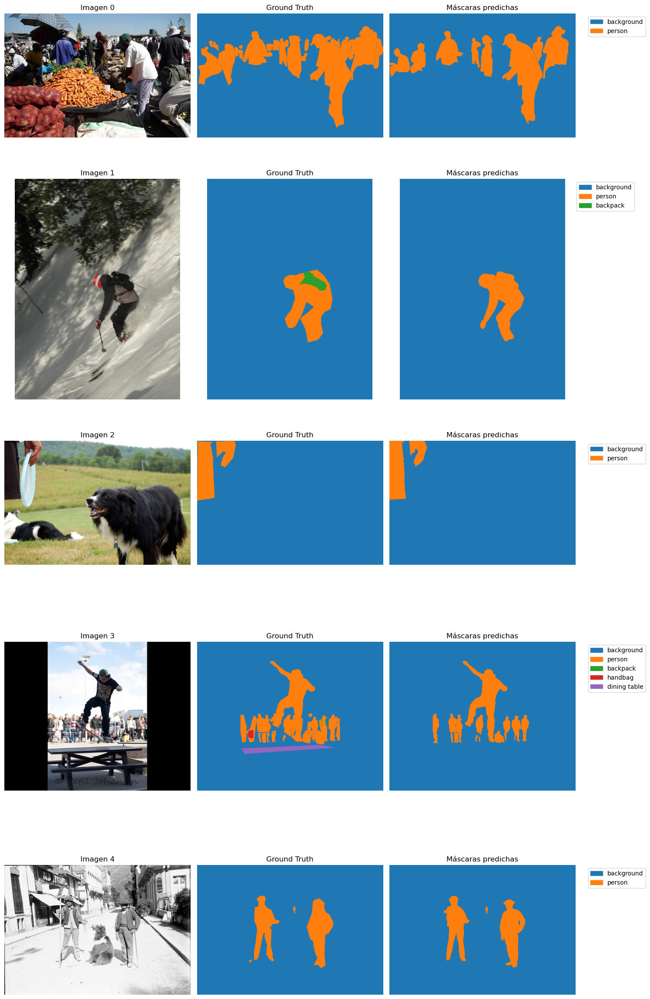

In [69]:
plot_differences_batch(results_images[:5], ground_truth, final_masks, category_info_objetive)


## 2. Obtención de métricas de rendimiento

Por último, se capturan las métricas de rendimiento asociadas y se guardan en el fichero `csv` para su posterior análisis.


Para ello, definimos la pipeline completa que permitirá la obtención de la inferencia de forma simplificada y en un formato común respecto al resto de modelos.

In [70]:
def get_data_id_image(id_image, coco):

    img_info = coco.loadImgs(id_image)[0]
    height, width = img_info['height'], img_info['width']
    img_path = f"{DIR_TRAIN_IMGS}/{img_info['file_name']}"

    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    ann_ids = coco.getAnnIds(imgIds=id_image)
    anns = coco.loadAnns(ann_ids)
    mask = np.zeros((height, width), dtype=np.uint8)

    for ann in anns:
        category_id = ann['category_id']

        if(category_id in category_info_objetive.keys()):
            binary_mask = coco.annToMask(ann)
            mask[binary_mask == 1] = category_id

    return image, mask

In [71]:
def get_one_hot_mask(current_scores, mask,categories_names_by_index ):

    one_hot_scores = np.zeros((len(categories_names_by_index), mask.shape[0], mask.shape[1]))

    for clase in sorted(categories_names_by_index.keys()):
        # print("mask shapes", mask.shape)
        # print("class", clase)
        # print("shapes ", one_hot_scores.shape)
        # print("scores shape ", current_scores.shape)
        one_hot_scores[clase, :, :] = np.where(mask == clase,current_scores , 0)

    one_hot_scores[0, :, :] = 1 - one_hot_scores[1:, :, :].sum(axis=0)

    #print("output has shape", one_hot_scores.shape)

    return one_hot_scores

def process_inference_yolo_sam(image, yolo_model, sam_model, mapper_indexModel_index_result, category_info_objetive):

    
    #######  INFERENCIA DE YOLO   #######

    yolo_boxes = []
    yolo_prob = []
    yolo_label = []
    results = yolo_model(image)
    
    for box_info in results[0]:
        x1,y1,x2,y2, conf, class_id = box_info.boxes.data[0].tolist()
        class_name = yolo_model.names[int(class_id)]

        if (class_name) in categories_index_by_name:
            yolo_boxes.append( (x1,y1,x2,y2))
            yolo_prob.append(conf)
            yolo_label.append(categories_index_by_name[class_name])

    inference = {}
    inference["boxes"] = yolo_boxes
    inference["scores"] = yolo_prob
    inference["labels"] = yolo_label


    ######  INFERENCIA DE SAM  ######

    sam_model.set_image(image)
    final_mask = np.zeros(image.shape[:2], dtype=np.int8)
    current_scores = np.zeros(image.shape[:2], dtype=np.float32)

    masks_image = []
    scores_image = []
    labels_image = []

    
    for box, score, label in zip(inference['boxes'], inference['scores'], inference['labels']):
        if(score > CONS_TRHESHOLD and label in category_info_objetive.keys()):
            masks, scores, _ = sam_model.predict(
                point_coords=None,
                point_labels=None,
                box= np.array([round(x) for x in box]),
                multimask_output=False
            )
            if np.any(masks):
                masks_image.append(masks)
                scores_image.append(scores)
                labels_image.append(label)

                mask_values = np.where(masks, scores, 0)
                final_mask = np.where(mask_values > current_scores , label, final_mask)
                current_scores = np.maximum(mask_values, current_scores)



    # Output preprocessing 
    final_mask = final_mask[0]
    current_scores = current_scores[0]
    final_mask = get_one_hot_mask(current_scores, final_mask,categories_names_by_index )

    

    return final_mask, current_scores


In [ ]:
def preprocess_dataset_mask(mask,mapper_indexModel_index_result, categories_names_by_index):

    mask_proprocessed = np.vectorize(lambda x: mapper_indexModel_index_result.get(x, x))(mask)
    one_hot_scores = np.zeros((len(categories_names_by_index), mask.shape[0], mask.shape[1]))

    for clase in sorted(categories_names_by_index.keys()):

        one_hot_scores[clase, :, :] = np.where(mask_proprocessed == clase,1 , 0)

    one_hot_scores[0, :, :] = 1 - one_hot_scores[1:, :, :].sum(axis=0)

    return one_hot_scores
    
#mask_preprocessed = preprocess_dataset_mask(mask,mapper_indexModel_index_result, categories_names_by_index)

#plot_one_hot_encoded_masks_norm(image, mask_preprocessed, categories_names_by_index)

In [73]:

def mean_average_precision(prob_mask, true_mask) -> float:

    C, H, W = true_mask.shape
    aps = []

    for c in range(C):
        y_true = true_mask[c].ravel().astype(int)
        y_score = prob_mask[c].ravel()

        if y_true.sum() != 0:
            ap = average_precision_score(y_true, y_score)
            aps.append(ap)

            # print("for ", c, " has value ",ap)


    return np.mean(aps)

In [74]:

def compute_iou(pred_mask, true_mask) -> float:


    ious = []
    num_classes = pred_mask.shape[0]

    for c in range(num_classes):
        pred = pred_mask[c]
        truth = true_mask[c]

        if  truth.any():

            intersection = np.logical_and(pred, truth).sum()
            union = np.logical_or(pred, truth).sum()

            iou = intersection / union if union != 0 else 0.0
            ious.append(iou)

            # print("For class ", c, " has value ", iou)



    return np.mean(ious)

In [75]:
def mean_pixel_accuracy(pred_mask, true_mask) -> float:


    class_accuracies = []

    for c in range(pred_mask.shape[0]):
        pred = pred_mask[c]
        truth = true_mask[c]

        total_true = truth.sum()
        if total_true != 0:

            correct = np.logical_and(pred, truth).sum()
            acc = correct / total_true
            class_accuracies.append(acc)
            
            # print("For class ", c, " has value ", acc)

    return np.mean(class_accuracies)


In [76]:


def mean_average_precision(prob_mask, true_mask) -> float:

    C, H, W = true_mask.shape
    aps = []

    for c in range(C):
        y_true = true_mask[c].ravel().astype(int)
        y_score = prob_mask[c].ravel()

        if y_true.sum() != 0:
            ap = average_precision_score(y_true, y_score)
            aps.append(ap)

            # print("for ", c, " has value ",ap)


    return np.mean(aps)

In [77]:
def get_value_metrics(prob_mask, ground_truth) -> tuple[float, float, float ]:

    # result = mean_pixel_accuracy(mask_one_hot_pred, mask_one_hot_gt)
    mean_pixel_acc = mean_pixel_accuracy(prob_mask, ground_truth)

    # result = compute_iou(mask_one_hot_pred, mask_one_hot_gt)

    iou = compute_iou(prob_mask, ground_truth)

    # mean_average_precision(one_hot_scores[0],mask_one_hot_gt )
    mean_av_pre = mean_average_precision(prob_mask, ground_truth)
    
    return mean_pixel_acc, iou, mean_av_pre


In [ ]:

list_mean_pixel_acc = []
list_iou = []
list_mean_av_prec = []
list_inference_time = []

ids_under_threshold = []
ids_over_threshold = []


for i, img_id in tqdm(enumerate(img_ids[:100])):
    try:

        image, mask_gt = get_data_id_image(img_id, coco,DIR_TRAIN_IMGS , category_info_objetive)
        mask_preprocessed_gt = preprocess_dataset_mask(mask_gt,mapper_indexModel_index_result, categories_names_by_index)

        comienzo_inferencia = time.time()
        mask_predicted, probs = process_inference_yolo_sam(image, yolo_model, sam_model, mapper_indexModel_index_result, category_info_objetive)
        fin_inferencia = time.time()

        mean_pixel_acc, iou, mean_av_pre = get_value_metrics(mask_predicted, mask_preprocessed_gt) 
        #print("metrics are ", mean_pixel_acc, iou, mean_av_pre)


        list_mean_pixel_acc.append(mean_pixel_acc)
        list_iou.append(iou)
        list_mean_av_prec.append(mean_av_pre)
        list_inference_time.append(round(fin_inferencia -comienzo_inferencia, 2) )

        if(mean_pixel_acc> 0.95):
            ids_over_threshold.append(img_id)

        elif(iou<0.5):
            ids_under_threshold.append(img_id)

    except Exception as e:
        print("Exception ", e , " at it ", i)

In [79]:

CONS_OUTPUT_PATH = r"C:\Users\ruben\Desktop\code_tfm\src\logs\train\results.csv"

try:
    df = pd.read_csv(CONS_OUTPUT_PATH)
except Exception as e:
    df = pd.DataFrame()


results = pd.DataFrame({
    "Model":["Ensable_YOLO+SAM"],
    "Mean_Pixel_Accuracy":[sum(list_mean_pixel_acc)/ len(list_mean_pixel_acc)],
    "Intersection_Over_Union":[sum(list_iou)/len(list_iou)],
    "Mean_Average_Precission":[sum(list_mean_av_prec)/len(list_mean_av_prec)],
    "Inference_Time":[sum(list_inference_time)/len(list_inference_time)]



})

df = pd.concat([df, results], ignore_index=True)


df.to_csv(CONS_OUTPUT_PATH, index=False)